In [1]:
import os
os.chdir("../")

In [2]:
import torch
import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from argparse import Namespace
%matplotlib inline

In [3]:
from src.datasets.vanderpol import VanderPol, plot_vanderpol, Data

from src.gpode.model_builder import build_model, compute_loss, compute_predictions, compute_test_predictions
from src.gpode.model_builder import Trainer
from src.gpode.model_initialization import initialize_inducing, initialize_latents_with_data

from src.misc.plot_utils import plot_model_initialization, plot_longitudinal, plot_vectorfield_posterior
from src.misc.settings import settings
from src.misc.torch_utils import numpy2torch, torch2numpy

In [4]:
device = settings.device

if device.type == 'cuda':
    torch.set_default_tensor_type('torch.cuda.FloatTensor')

In [5]:
# setup all the experiment parameters
args = Namespace(**{ 
    'num_train': "all",
    'num_features':256,  # number of RFF features for sampling from GP prior
    'num_inducing':1024,   # number of inducing points for variational GP posterior
    'q_diag':False,      # diagonal posterior assumption for inducing variables
    'dimwise':False,      # keep separate kernel parameters for ODE transition
    
    'data_obs_S':32,     # observation sequence length for training data
    'data_obs_T':1,      # observation time for training data
    'data_obs_noise_var':0.01, # observation noise std dev
    
    'solver':'dopri5',   # ODE integrator
    'use_adjoint':False, # use adjoint method for gradient computation
    'ts_dense_scale':2,  # number of time steps to evaluate between every observation
    
    'num_iter':200,   # optimization iterations
    'lr':0.001,          # optimization learning rate
     
    'log_freq':20,       # logging frequency
    'exact': False,
    'datadir':'data/dynamic_sys/volterra_lotka_32p-32f_normalized/',
})

### Generating data 

In [6]:
# n_ahead = args.data_obs_S
# N= 10
# x0  = np.array([[-0.5, 2.5]])
# x0 = np.random.uniform(-2, 2, size=(N, 2))
# _data = VanderPol(S_train=args.data_obs_S, T_train=args.data_obs_T,
#                  S_test=args.data_obs_S + n_ahead,
#                  T_test=(args.data_obs_T * (args.data_obs_S + n_ahead - 1) / (args.data_obs_S - 1)),
#                  noise_var=args.data_obs_noise_var,
#                  x0 = x0,
#                 )

# plot_vanderpol(data)

In [7]:
def load_trajectory_dataset_as_Data(path: str, verbose=True):
    with np.load(path) as _d:
        trajectory_dict = {}
        for key in _d.keys():
            if key[-2:] == "_x":
                if not (key[:-2] + "_t" in _d.keys()):
                    if verbose:
                        print(f"Dataset is missing time values for {key}.")
                    trajectory_dict.update(
                        {
                            key[:-1]: {"X":_d[key], "T":np.linspace(0, 1, _d[key].shape[1])}
                            
                        }
                    )
                else:
                    trajectory_dict.update(
                        {key[:-2]: {"X":_d[key], "T":_d[key[:-2] + "_t"]}}
                    )
    return trajectory_dict

In [8]:
os.getcwd()

'/workspaces/gaussian-process-odes'

In [9]:
mode = "exact" if args.exact else "noisy"
path = f"data/dynamic_sys/volterra_lotka_32p-32f_normalized/fold0/{mode}.npz"

In [10]:
with np.load(path, allow_pickle=1)  as _d:
    _d_dict = dict(_d)
    _d_dict = {key:_d_dict[key].item() for key in _d_dict}

In [11]:
def input_output_2_dataset(dict_a):
    steps_pred = dict_a["output"]["X"].shape[1]
    X = np.concatenate([dict_a["input"]["X"], dict_a["output"]["X"]], axis=1)
    T = np.concatenate([dict_a["input"]["T"], dict_a["output"]["T"]], axis=1)
    X = np.concatenate([X[:, :steps_pred], X[:, -steps_pred:]], axis=0)
    T = np.concatenate([T[:, :steps_pred], T[:, -steps_pred:]], axis=0)
    
    assert np.allclose(np.diff(T, axis=1), np.diff(T, axis=1)[0]), "handle irregular time grids"
    T = np.squeeze(dict_a["output"]["T"][0, :])
    return Data(X, T)

def output_2_dataset(dict_a):
    T = dict_a["output"]["T"]
    assert np.allclose(np.diff(T, axis=1), np.diff(T, axis=1)[0]), "handle irregular time grids"
    return Data(dict_a["output"]["X"], np.squeeze(T[0, :]))

In [12]:
data_train = input_output_2_dataset(_d_dict["train"])
data_val = output_2_dataset(_d_dict["val"])
data_test = output_2_dataset(_d_dict["test"])

In [13]:
class Dataset:
    def __init__(self, trn:Data, tst:Data):
        self.trn = trn
        self.tst = tst  
        _min = trn.ys.min(0).min(0)
        _max = trn.ys.max(0).max(0)
        self.xlim = (_min[0], _max[0])
        self.ylim = (_min[1], _max[1])
    def f(self, y, t):
        return np.zeros_like(y)

In [14]:
data = Dataset(data_train, data_test)

In [15]:
train_ys = torch.tensor(data.trn.ys)
train_ts = torch.tensor(data.trn.ts)

test_ys = torch.tensor(data.tst.ys)
test_ts = torch.tensor(data.tst.ts)

### Model definition and initialization

We use empirical gradients to initialize the vector field close to ground truth. The following plot shows the GPODE vector field after model initialization.  

In [16]:
model = build_model(args, data.trn.ys)
model = initialize_inducing(model, data.trn.ys, data.trn.ts.max())
model = initialize_latents_with_data(model, data.trn.ys, data.trn.ts)

100%|██████████| 20/20 [00:07<00:00,  2.77it/s]


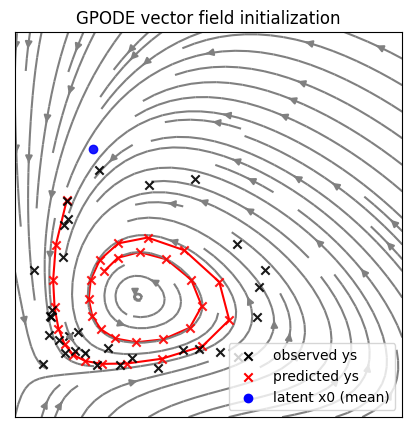

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))

plot_model_initialization(ax, data, model, train_ys, train_ts, 
                          compute_predictions, has_latents=False)
ax.set_title('GPODE vector field initialization')
plt.show()

### Optimization

In [18]:
trainer = Trainer()
model, _ = trainer.train(model = model,
                         loss_function = compute_loss,
                         ys = train_ys, ts = train_ts, 
                         num_iter = args.num_iter, 
                         lr = args.lr, 
                         log_freq = args.log_freq)

In [19]:
print("Observation noise variance:")
print(model.likelihood.variance.data)
print("kernel lengthscales:")
print(model.flow.odefunc.diffeq.kern.lengthscales.data)
print("kernel signal variance:")
print(model.flow.odefunc.diffeq.kern.variance.data)

Observation noise variance:
tensor([0.2534, 0.2563])
kernel lengthscales:
tensor([1.2248, 1.3019])
kernel signal variance:
tensor([0.4841])


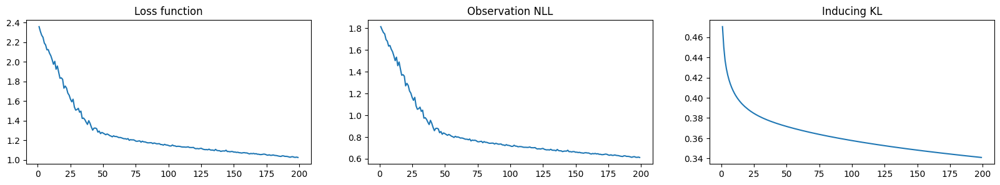

In [20]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20,3))

ax1.plot(trainer.loss_meter.iters, 
         trainer.loss_meter.vals)
ax1.set_title("Loss function")
ax2.plot(trainer.observ_nll_meter.iters, 
         trainer.observ_nll_meter.vals)
ax2.set_title("Observation NLL")
ax3.plot(trainer.inducing_kl_meter.iters, 
         trainer.inducing_kl_meter.vals)
ax3.set_title("Inducing KL")
plt.show()

### Visualize model predictions

In [21]:
test_pred = torch2numpy(compute_test_predictions(model, test_ys[:, 0], ts=test_ts, eval_sample_size=64))

100%|██████████| 64/64 [00:18<00:00,  3.40it/s]


In [22]:
def calc_metrics(
    predictive_mean,
    predictive_var,
    target,
    trivial_mean  = 0.0,
    trivial_var  = 1.0,
    return_as_float=True,
):

    assert predictive_mean.shape == predictive_var.shape == target.shape, (
        predictive_mean.shape,
        predictive_var.shape,
        target.shape,
    )
    if not isinstance(trivial_mean, np.ndarray):
        assert trivial_mean.shape == target.shape, (
            trivial_mean.shape,
            target.shape,
        )
    mean = np.mean
    log2pi = 0.79817986835
    # baseline
    # --------------------------------------------------------------------------
    trivial_r_sq = np.abs(trivial_mean - target) ** 2
    trivial_MSE = mean(trivial_r_sq)
    trivial_RMSE = trivial_MSE**0.5
    trivial_SMSE = mean(trivial_r_sq / trivial_var)
    trivial_LL = (
        trivial_r_sq / trivial_var + np.log(trivial_var) + log2pi
    ) / 2
    trivial_MLL = mean(trivial_LL)
    # actual model
    # --------------------------------------------------------------------------
    r_sq = np.abs(predictive_mean - target) ** 2
    # noise variance is already in accounted for in gpjax.likelihoods.Gaussian
    var = predictive_var + torch2numpy(model.likelihood.variance.data)[None, None]  # + obs_variance
    MSE = mean(r_sq)
    RMSE = MSE**0.5
    SMSE = mean(r_sq / trivial_var)
    LL = (r_sq / (var) + np.log(var) + log2pi) / 2
    MLL = mean(LL)
    MSLL = MLL - trivial_MLL
    result = {
        "model": {
            "MSE": MSE,
            "RMSE": RMSE,
            "SMSE": SMSE,
            "MLL": MLL,
            "MSLL": MSLL,
        },
        "trivial": {
            "MSE": trivial_MSE,
            "RMSE": trivial_RMSE,
            "SMSE": trivial_SMSE,
            "MLL": trivial_MLL,
            "MSLL": 0.0,
        },
    }
    return result

In [23]:
model.likelihood.variance.data

tensor([0.2534, 0.2563])

In [24]:
trivial_var = torch.tensor([train_ys[..., i].var() for i in range(train_ys.shape[-1])])

In [25]:

model_mean = test_pred.mean(0)
model_var = test_pred.var(0)

trivial_var = np.full_like(model_var, data.trn.ys.var())
trivial_mean = np.full_like(model_mean, data.trn.ys.mean())

metrics = calc_metrics(
    trivial_mean=trivial_mean,
    trivial_var=trivial_var,
    predictive_mean=model_mean,
    predictive_var=model_var,
    target=torch2numpy(test_ys),
    return_as_float=False,
)["model"]
result = {}
result.update({(str(k).lower(), v.real) for k, v in metrics.items()})

In [26]:
result

{'smse': 0.20203957,
 'mse': 0.20185064,
 'rmse': 0.4492779070837347,
 'mll': 0.11090418,
 'msll': -0.72153383}

/workspaces/gaussian-process-odes/src/misc/plot_utils.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, figsize=(8 * 2, 3 * 1))


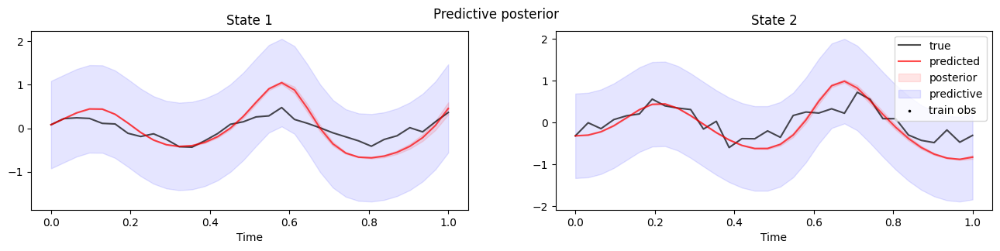

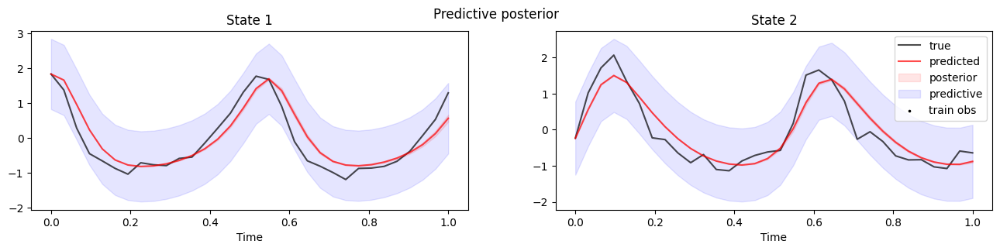

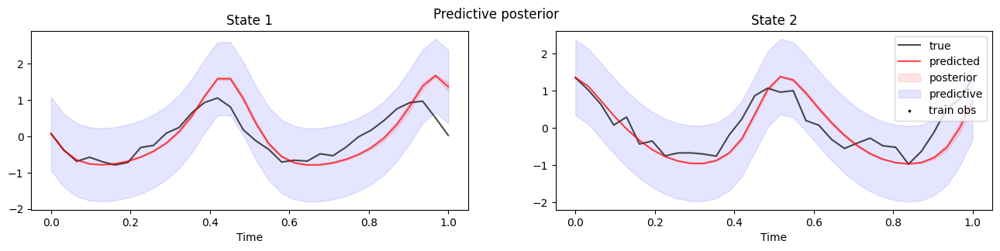

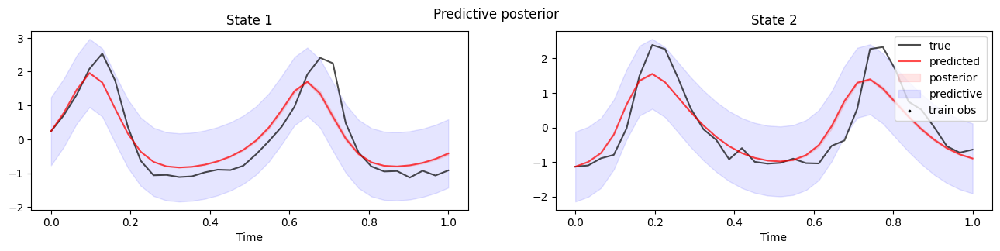

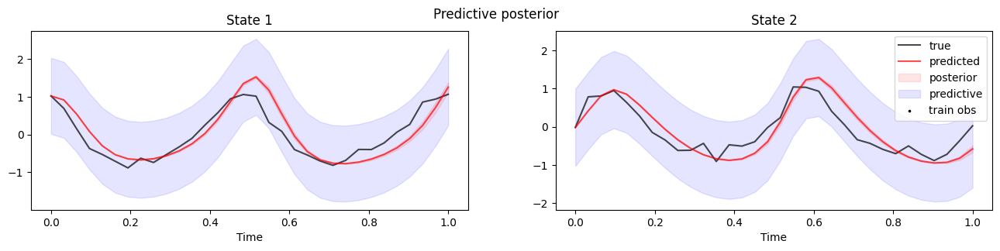

...

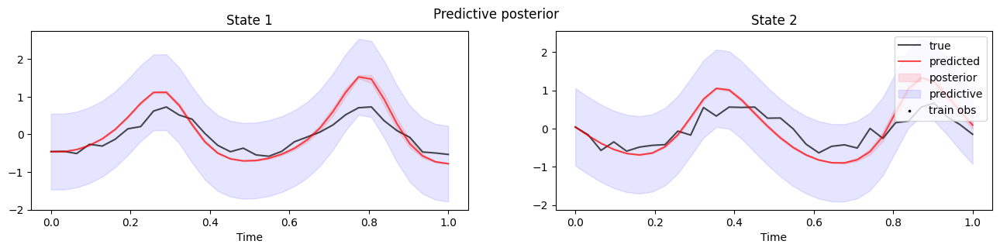

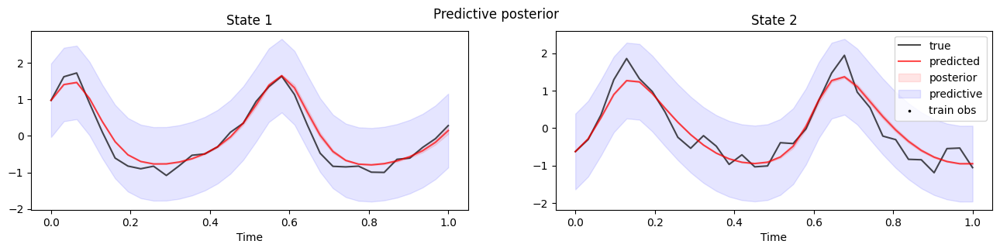

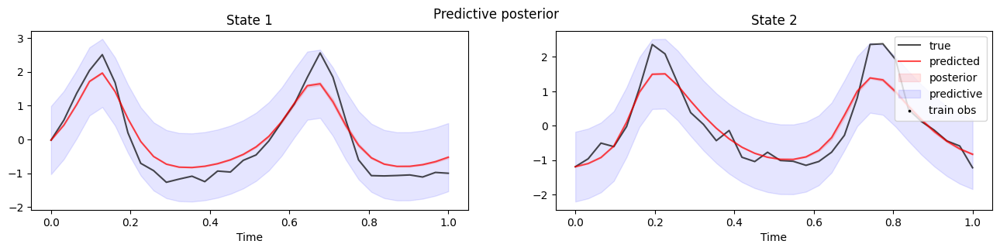

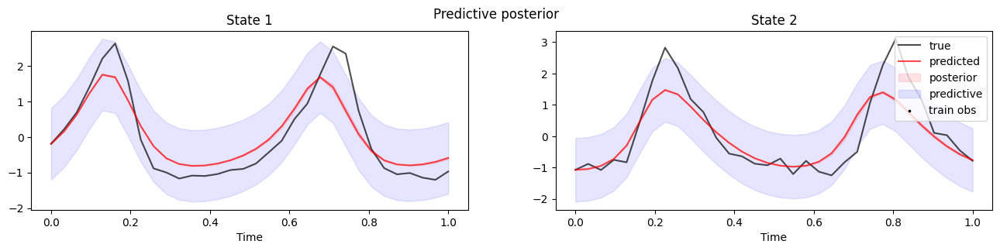

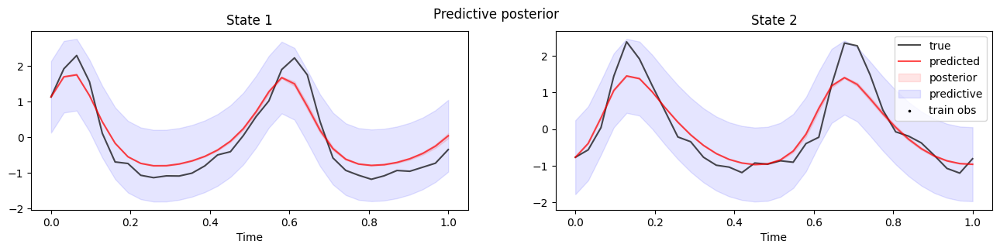

In [27]:
plot_longitudinal(data, test_pred, torch2numpy(model.likelihood.variance))

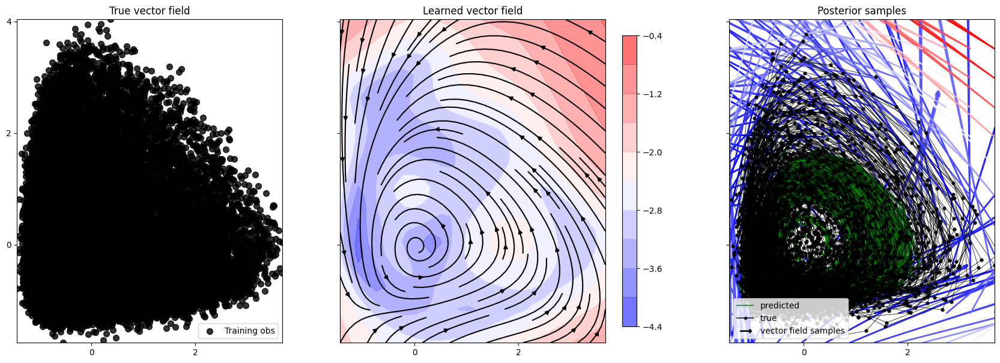

In [ ]:
plot_vectorfield_posterior(model, data, test_pred)